In [222]:
import pandas as pd
from matplotlib import pyplot as plt
import random
import numpy as np
import math
import importlib
import mcmc_functions
import re
importlib.reload(mcmc_functions)

from mcmc_functions import *
import importlib

seasons_missing_df = pd.read_csv('/Users/josephsun/Desktop/M4R/code/premier-league-matches.csv')
tables_df = pd.read_csv('/Users/josephsun/Desktop/M4R/code/pl-tables-1993-2024.csv')
recent_df = pd.read_csv('matches.csv')
recent_df = recent_df[recent_df['Venue'] == 'Home']


In [165]:
converted_recent_df = convert_match_data(recent_df)
converted_recent_df = converted_recent_df.sort_values(by='Wk').reset_index(drop=True)

# Apply to the 'Home' column
converted_recent_df['Home'] = converted_recent_df['Home'].apply(insert_space)
converted_recent_df['Home'] = converted_recent_df['Home'].replace('Brightonand Hove Albion', 'Brighton')
converted_recent_df['Home'] = converted_recent_df['Home'].replace('Manchester United', 'Manchester Utd')
converted_recent_df['Home'] = converted_recent_df['Home'].replace('Newcastle United', 'Newcastle Utd')
converted_recent_df['Home'] = converted_recent_df['Home'].replace('Nottingham Forest', "Nott'ham Forest")
converted_recent_df['Home'] = converted_recent_df['Home'].replace('Sheffield United', 'Sheffield Utd')
converted_recent_df['Home'] = converted_recent_df['Home'].replace('Tottenham Hotspur', 'Tottenham')
converted_recent_df['Home'] = converted_recent_df['Home'].replace('West Ham United', 'West Ham')
converted_recent_df['Home'] = converted_recent_df['Home'].replace('Wolverhampton Wanderers', 'Wolves')

seasons_df = pd.concat([seasons_missing_df, converted_recent_df], ignore_index=True)

In [166]:
set(converted_recent_df['Home'])

{'Arsenal',
 'Aston Villa',
 'Bournemouth',
 'Brentford',
 'Brighton',
 'Burnley',
 'Chelsea',
 'Crystal Palace',
 'Everton',
 'Fulham',
 'Liverpool',
 'Luton Town',
 'Manchester City',
 'Manchester Utd',
 'Newcastle Utd',
 "Nott'ham Forest",
 'Sheffield Utd',
 'Tottenham',
 'West Ham',
 'Wolves'}

In [167]:
seasons_df[seasons_df['Season_End_Year'] == 2024]

,Season_End_Year,Wk,Date,Home,HomeGoals,AwayGoals,Away,FTR
12026,2024,1,2023-08-14,Manchester Utd,1,0,Wolves,H
12027,2024,1,2023-08-12,Arsenal,2,1,Nott'ham Forest,H
12028,2024,1,2023-08-12,Sheffield Utd,0,1,Crystal Palace,A
12029,2024,1,2023-08-11,Burnley,0,3,Manchester City,A
12030,2024,1,2023-08-13,Chelsea,1,1,Liverpool,D
...,...,...,...,...,...,...,...,...
12401,2024,38,2024-05-19,Liverpool,2,0,Wolves,H
12402,2024,38,2024-05-19,Arsenal,2,1,Everton,H
12403,2024,38,2024-05-19,Manchester City,3,1,West Ham,H
12404,2024,38,2024-05-19,Burnley,1,2,Nott'ham Forest,A


In [168]:
full_strength_dict, full_parameters, full_acceptance_counters, full_tracked_parameters, full_strength_dict_original, full_parameters_original = (
mcmc(seasons_df, 2013, 2024, burn_in = 20000, iterations = 40000))

In [169]:
full_acceptance_counters

{'Strength': {'accepted': 20203, 'total': 32094},
 'Home Advantage': {'accepted': 14,
  'total': 2004,
  'percentage': 0.6986027944111777},
 'Away Advantage': {'accepted': 8,
  'total': 1963,
  'percentage': 0.4075394803871625},
 'Mu_P': {'accepted': 10, 'total': 2026, 'percentage': 0.4935834155972359},
 'Sigma_P': {'accepted': 10, 'total': 2026, 'percentage': 0.4935834155972359},
 'Eta': {'accepted': 15, 'total': 1913, 'percentage': 0.7841087297438577},
 'Sigma_S': {'accepted': 15, 'total': 1913, 'percentage': 0.7841087297438577}}

/Users/josephsun/Desktop/M4R/code/mcmc_functions.py:717: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  
/Users/josephsun/Desktop/M4R/code/mcmc_functions.py:717: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  


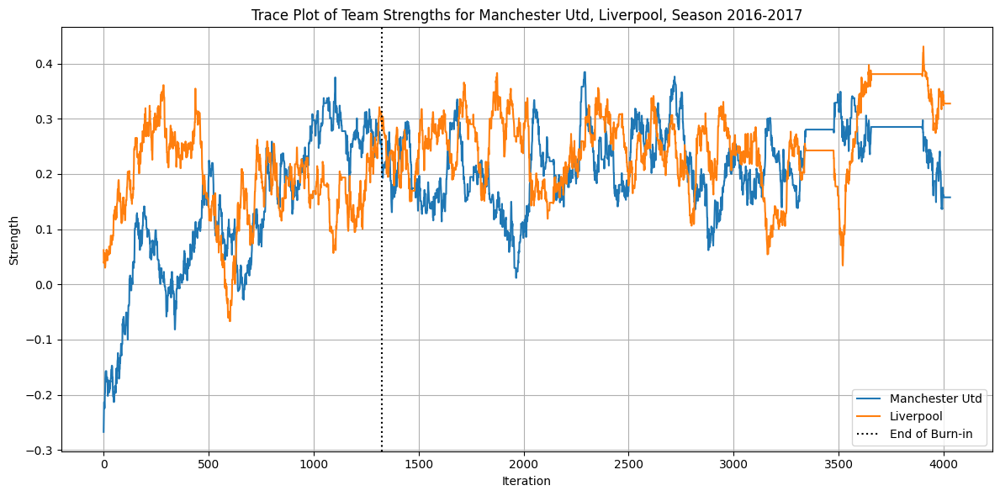

In [250]:
trace_plot_strength_with_burnin(full_strength_dict, full_strength_dict_original, ['Manchester Utd', 'Liverpool'], 2017)

/Users/josephsun/Desktop/M4R/code/mcmc_functions.py:715: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  joined_df['Strength History'] = joined_df.values.tolist()
/Users/josephsun/Desktop/M4R/code/mcmc_functions.py:715: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  joined_df['Strength History'] = joined_df.values.tolist()


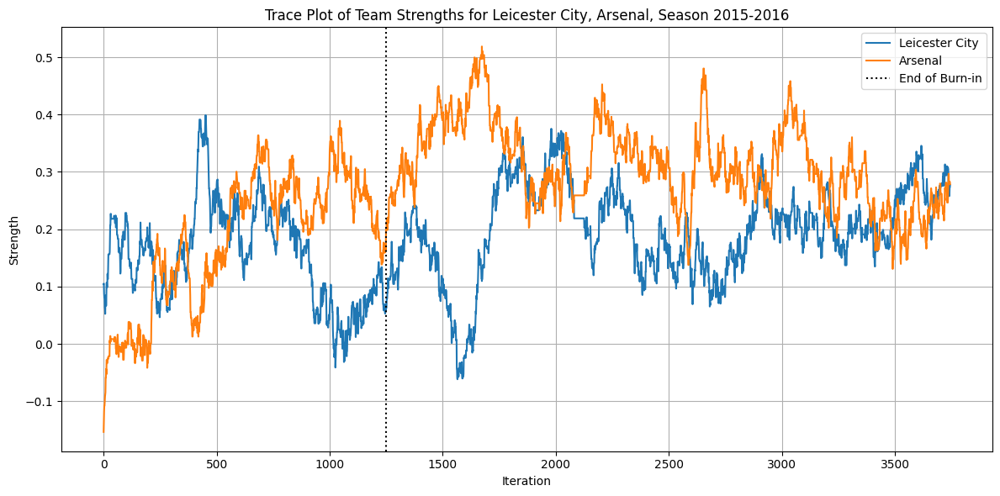

In [158]:
trace_plot_strength_with_burnin(full_strength_dict, full_strength_dict_original, ['Leicester City', 'Arsenal'], 2016)

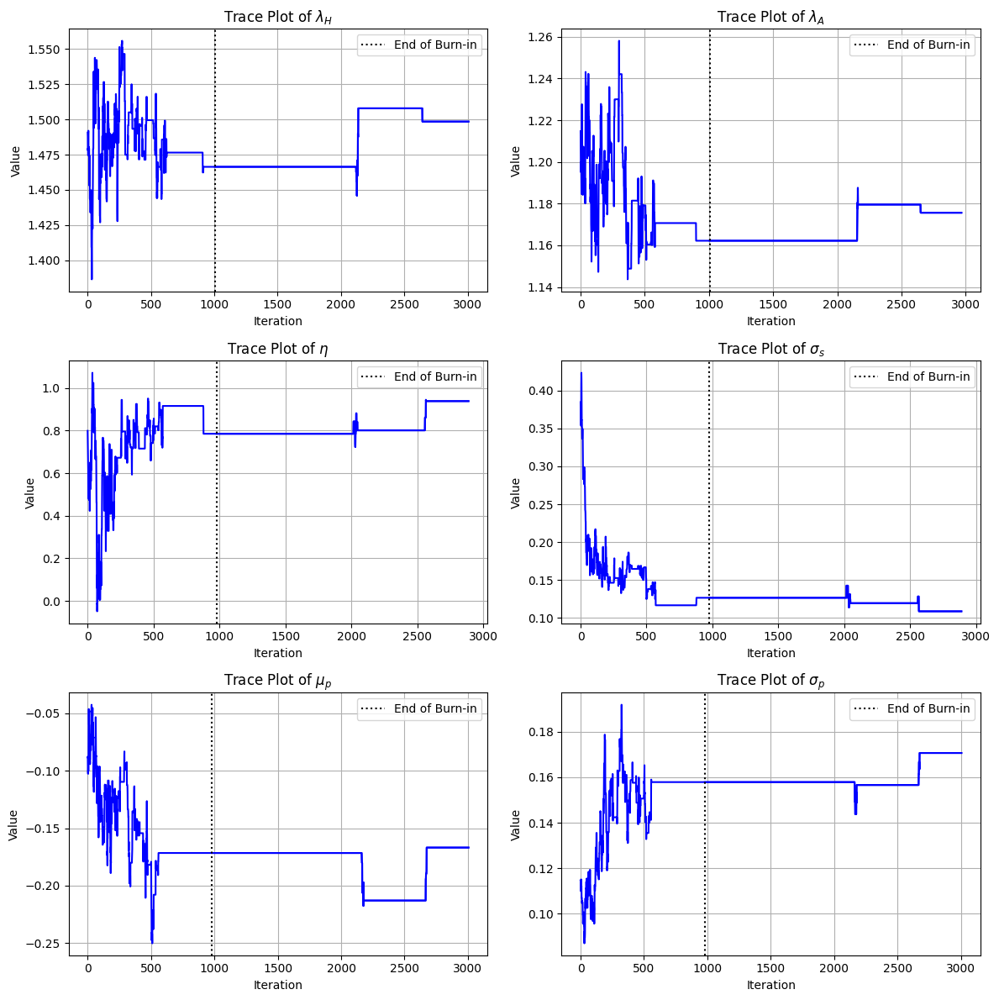

In [171]:
trace_plot_parameter_with_burnin(full_parameters, full_parameters_original)

/Users/josephsun/Desktop/M4R/code/mcmc_functions.py:717: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  


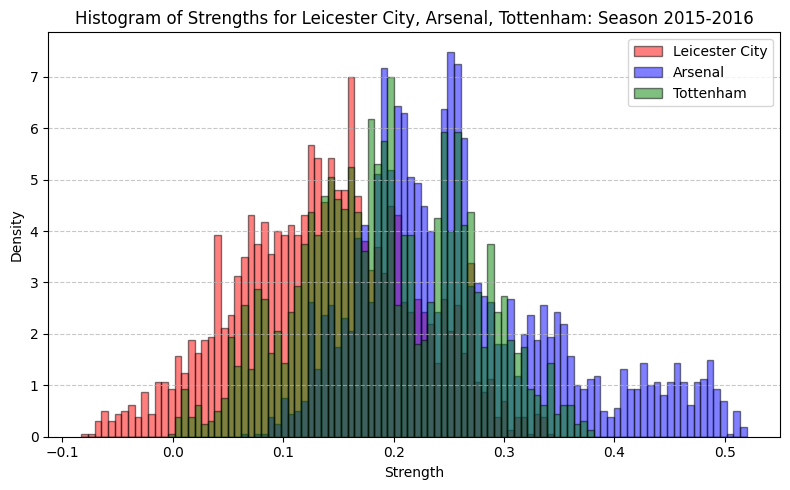

In [191]:
strength_histogram(full_strength_dict, ['Leicester City', 'Arsenal', 'Tottenham'], 2016, colours = ['Red', 'Blue', 'Green'], bins = 100)

/Users/josephsun/Desktop/M4R/code/mcmc_functions.py:717: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  


Arsenal's strength was greater than Leicester City's strength in 84.08577878103839% of the iterations


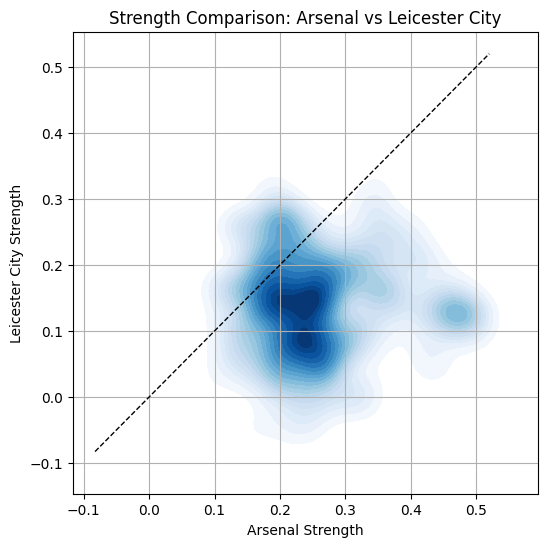

In [192]:
comparison_plot(full_strength_dict, 'Arsenal', 'Leicester City', 2016)

Effective Sample Size for Manchester Utd: 23.28 out of 2727


/Users/josephsun/Desktop/M4R/code/mcmc_functions.py:717: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  


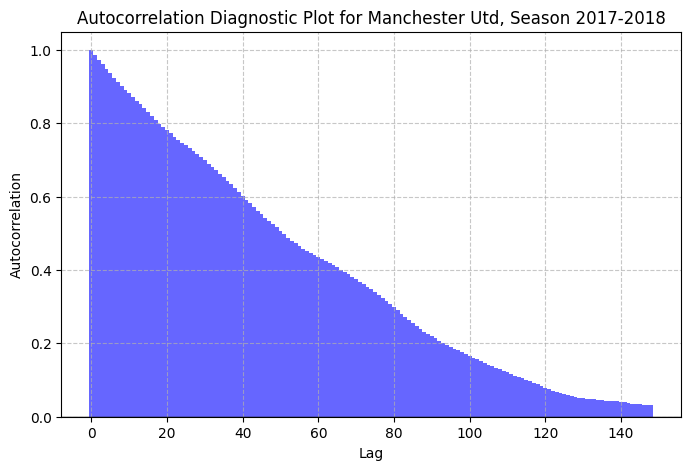

[np.float64(1.0),
 np.float64(0.9863760774113126),
 np.float64(0.9738182478157454),
 np.float64(0.960826583504608),
 np.float64(0.948444460449582),
 np.float64(0.9366298462928673),
 np.float64(0.9250690056737251),
 np.float64(0.9140971998301124),
 np.float64(0.9027352339154593),
 np.float64(0.892203756243861),
 np.float64(0.8815688763366986),
 np.float64(0.8715852792623039),
 np.float64(0.8619788157459984),
 np.float64(0.8517786141378708),
 np.float64(0.8417197806516309),
 np.float64(0.8310285123876437),
 np.float64(0.8202255288495451),
 np.float64(0.809786069785073),
 np.float64(0.799695363237417),
 np.float64(0.7905826839677395),
 np.float64(0.7814865868944335),
 np.float64(0.7729878623740228),
 np.float64(0.7640533874874954),
 np.float64(0.755394020343474),
 np.float64(0.7474638480863499),
 np.float64(0.7398454314208017),
 np.float64(0.7325530039657973),
 np.float64(0.7243436969001347),
 np.float64(0.7159280998460024),
 np.float64(0.7071983543620292),
 np.float64(0.6989228907537437)

In [174]:
autocorrelation_plot(full_strength_dict, 'Manchester Utd', 2018, max_lag = 150)

In [193]:
new_season = seasons_df[seasons_df['Season_End_Year'] == 2017]
sampled_score, league_table, strengths = sample_season(new_season, full_strength_dict, 2016, full_parameters)

/Users/josephsun/Desktop/M4R/code/mcmc_functions.py:1101: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  for _, row in df.iterrows():


In [198]:
prob_df = simulate_league_outcomes(new_season, full_strength_dict, 2016, full_parameters, num_simulations = 1000, truncate = 15)

/Users/josephsun/Desktop/M4R/code/mcmc_functions.py:1101: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  for _, row in df.iterrows():
/Users/josephsun/Desktop/M4R/code/mcmc_functions.py:1101: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  for _, row in df.iterrows():
/Users/josephsun/Desktop/M4R/code/mcmc_functions.py:1101: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_

In [199]:
prob_df

Final Position,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
Team,,,,,,,,,,,,,,,
Manchester City,0.215,0.158,0.112,0.103,0.088,0.071,0.051,0.045,0.027,0.026,0.028,0.024,0.014,0.013,0.008
Arsenal,0.183,0.14,0.108,0.098,0.067,0.076,0.059,0.042,0.054,0.039,0.034,0.024,0.021,0.012,0.016
Manchester Utd,0.106,0.102,0.094,0.104,0.077,0.074,0.073,0.068,0.058,0.044,0.04,0.037,0.026,0.028,0.023
Tottenham,0.106,0.081,0.099,0.092,0.084,0.079,0.059,0.062,0.069,0.054,0.052,0.038,0.027,0.033,0.015
Southampton,0.072,0.088,0.105,0.074,0.077,0.073,0.084,0.075,0.066,0.057,0.045,0.042,0.036,0.034,0.021
Liverpool,0.073,0.069,0.105,0.085,0.092,0.072,0.085,0.063,0.063,0.065,0.054,0.03,0.037,0.028,0.021
Chelsea,0.063,0.069,0.074,0.073,0.078,0.074,0.067,0.083,0.065,0.045,0.057,0.049,0.04,0.048,0.028
West Ham,0.049,0.077,0.061,0.066,0.065,0.075,0.076,0.068,0.063,0.057,0.089,0.053,0.034,0.044,0.033
Leicester City,0.068,0.07,0.066,0.061,0.086,0.09,0.065,0.073,0.057,0.063,0.049,0.05,0.036,0.041,0.03


In [197]:
print(prob_df.to_latex(escape = False))

\begin{tabular}{lllllllll}
\toprule
Final Position & 1 & 2 & 3 & 4 & 5 & 6 & 7 & 8 \\
Team &  &  &  &  &  &  &  &  \\
\midrule
Manchester City & 0.230500 & 0.158000 & 0.112000 & 0.092000 & 0.084500 & 0.061500 & 0.060500 & 0.046500 \\
Arsenal & 0.169000 & 0.120000 & 0.112000 & 0.106000 & 0.086500 & 0.079000 & 0.069500 & 0.050500 \\
Tottenham & 0.102000 & 0.104000 & 0.093000 & 0.074000 & 0.103500 & 0.077000 & 0.070500 & 0.061000 \\
Manchester Utd & 0.101500 & 0.108500 & 0.099500 & 0.094000 & 0.083500 & 0.071000 & 0.066500 & 0.060500 \\
Southampton & 0.078000 & 0.094000 & 0.085000 & 0.092500 & 0.084000 & 0.080500 & 0.073000 & 0.071000 \\
Liverpool & 0.075500 & 0.090500 & 0.082000 & 0.084000 & 0.076500 & 0.081000 & 0.083500 & 0.067500 \\
Chelsea & 0.060000 & 0.068500 & 0.089000 & 0.073000 & 0.073500 & 0.071000 & 0.075500 & 0.077000 \\
Leicester City & 0.053500 & 0.069000 & 0.077500 & 0.080000 & 0.074500 & 0.077000 & 0.073000 & 0.082000 \\
\bottomrule
\end{tabular}



In [200]:
start_year = 2012
end_year = 2023

def compare_distributions(new_season, strength_dict, year, parameters, start_year, end_year):
    all_seasons = []
    for year in range(start_year, end_year + 1):
        season_df, _, _ = sample_season(new_season, strength_dict, year, parameters)
        season_df['Season_End_Year'] = year  # Optionally tag the year
        all_seasons.append(season_df)
    
    all_seasons_df = pd.concat(all_seasons, ignore_index=True)
    
    table_1, _ = goal_summary(all_seasons_df, start_year + 1, end_year + 1)
    table_2 , _= goal_summary(seasons_df, start_year + 1, end_year + 1)
    return subtract_prob_dfs(table_1, table_2)




Effective Sample Size for Home Advantage: 3.86 out of 2004


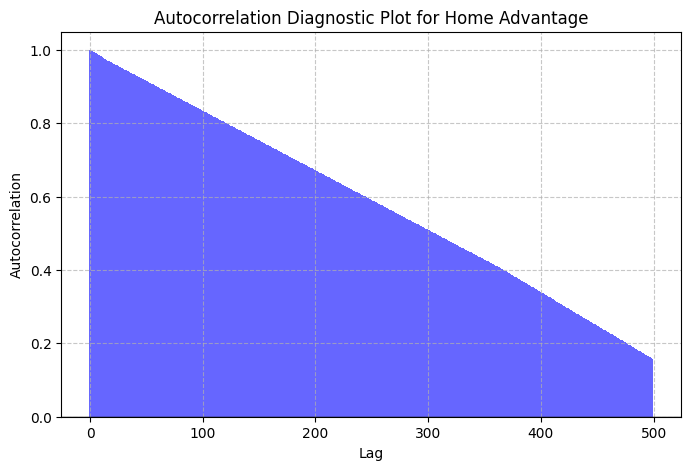

In [176]:
eff_sample_size_parameter(full_parameters, 'Home Advantage', max_lag = 500)

Effective Sample Size for Away Advantage: 6.61 out of 1963


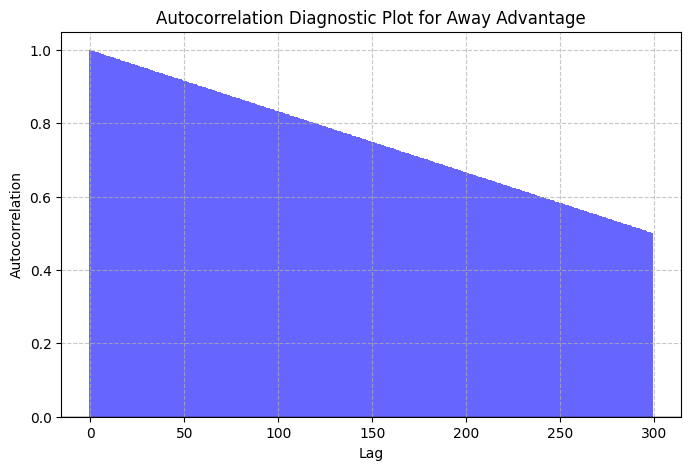

In [177]:
eff_sample_size_parameter(full_parameters, 'Away Advantage', max_lag = 300)

Effective Sample Size for Eta: 5.41 out of 1913


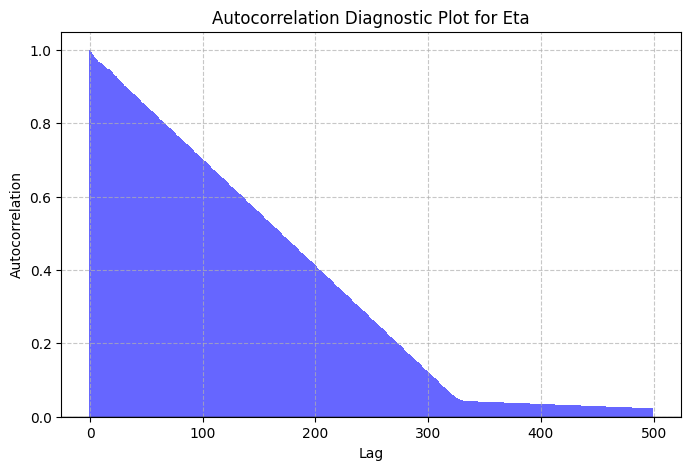

In [178]:
eff_sample_size_parameter(full_parameters, 'Eta', max_lag = 500)

Effective Sample Size for Sigma_S: 3.95 out of 1913


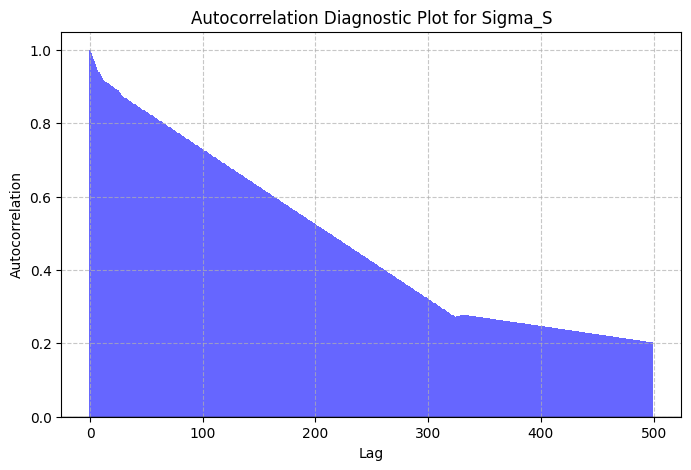

In [179]:
eff_sample_size_parameter(full_parameters, 'Sigma_S', max_lag = 500)

Effective Sample Size for Mu_P: 7.42 out of 2026


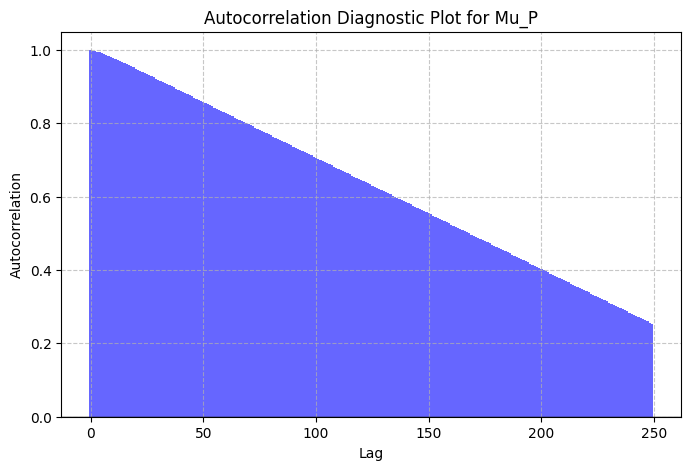

In [181]:
eff_sample_size_parameter(full_parameters, 'Mu_P', max_lag = 250)

Effective Sample Size for Sigma_P: 7.80 out of 2026


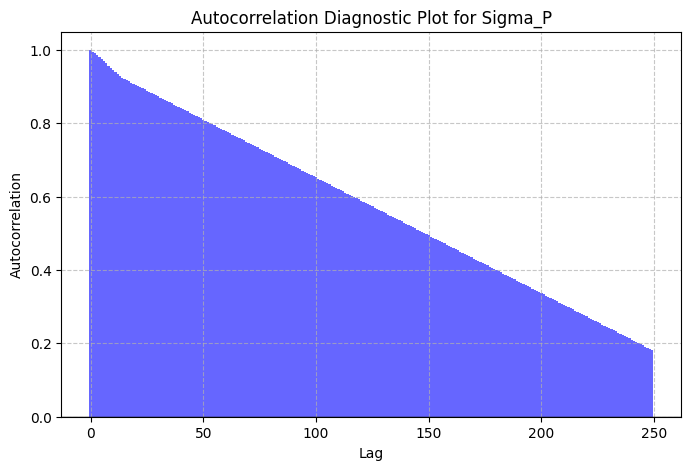

In [182]:
eff_sample_size_parameter(full_parameters, 'Sigma_P', max_lag = 250)

In [201]:
parameter_end = summarise_parameters(full_parameters)

In [202]:
print(parameter_end.to_latex(escape = False))

\begin{tabular}{lll}
\toprule
 & Parameter & Mean (Std. Error) \\
\midrule
0 & Home Advantage & 1.4827 (0.0004) \\
1 & Away Advantage & 1.1687 (0.0002) \\
2 & Eta & 0.8164 (0.0013) \\
3 & Sigma_S & 0.1219 (0.0002) \\
4 & Mu_P & -0.1810 (0.0004) \\
5 & Sigma_P & 0.1596 (0.0001) \\
\bottomrule
\end{tabular}



In [207]:

def percent_diff_prob_dfs(prob_df1, prob_df2):
    """
    Compute percentage difference between two formatted prob_df tables 
    from goal_summary, including marginals.

    Returns a new DataFrame with the same structure, values formatted as '±XX.XX%'.
    """
    if not prob_df1.columns.equals(prob_df2.columns):
        raise ValueError("prob_df columns do not match")
    if not prob_df1.index.equals(prob_df2.index):
        raise ValueError("prob_df indexes do not match")

    result = prob_df1.copy()

    for i in range(len(prob_df1)):
        for j in range(len(prob_df1.columns)):
            val1 = prob_df1.iloc[i, j]
            val2 = prob_df2.iloc[i, j]

            # Skip top-left corner cell (usually empty)
            if i == 0 and j == 0:
                continue

            try:
                mean1 = float(val1.split()[0])
                mean2 = float(val2.split()[0])

                if mean2 == 0:
                    result.iloc[i, j] = "NA"
                else:
                    pct_diff = 100 * (mean1 - mean2) / mean2
                    result.iloc[i, j] = f"{pct_diff:+.2f}%"
            except Exception:
                result.iloc[i, j] = "NA"

    return result




def compare_distributions(strength_dict, parameters, start_year, end_year):
    all_seasons = []
    for year in range(start_year, end_year + 1):
        season_df, _, _ = sample_season(seasons_df[seasons_df['Season_End_Year'] == year], strength_dict, year, parameters)
        season_df['Season_End_Year'] = year
        all_seasons.append(season_df)

    all_seasons_df = pd.concat(all_seasons, ignore_index=True)

    table_1, _ = goal_summary(all_seasons_df, start_year + 1, end_year + 1)
    table_2, _ = goal_summary(seasons_df, start_year + 1, end_year + 1)
    return percent_diff_prob_dfs(table_1, table_2)





In [208]:
start_year = 2019
end_year = 2023

new_season = seasons_df[seasons_df['Season_End_Year'] == 2017]

comparison_df = compare_distributions(full_strength_dict, full_parameters, start_year, end_year)

/Users/josephsun/Desktop/M4R/code/mcmc_functions.py:1101: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  for _, row in df.iterrows():
/Users/josephsun/Desktop/M4R/code/mcmc_functions.py:1101: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  for _, row in df.iterrows():
/Users/josephsun/Desktop/M4R/code/mcmc_functions.py:1101: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_

Average Home Goals: 1.56
Average Away Goals: 1.19
Average Home Goals: 1.56
Average Away Goals: 1.31


/Users/josephsun/Desktop/M4R/code/mcmc_functions.py:1101: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  for _, row in df.iterrows():
/Users/josephsun/Desktop/M4R/code/mcmc_functions.py:1101: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  for _, row in df.iterrows():


In [217]:
comparison_df

Away Goals                                    
  Home Goals          0        1        2        3        4
                +10.37%   +1.51%   -9.48%   +1.94%  -26.32%
0     +4.76%    +39.29%  +10.14%  -26.32%  +14.29%   +0.00%
1     -7.48%     -1.11%  -11.93%   -1.49%   -3.03%  -46.67%
2     +7.20%    +13.89%   +6.17%   -2.04%  +39.13%  -37.50%
3    -10.85%     +2.27%  -10.64%   -8.33%  -63.64%   +0.00%
4    +24.53%     +9.52%  +58.82%  +57.14%  -50.00%   +0.00%

In [209]:
print(comparison_df.to_latex(escape = False))

\begin{tabular}{lllllll}
\toprule
 &  & Away Goals & \multicolumn{4}{r}{} \\
 & Home Goals & 0 & 1 & 2 & 3 & 4 \\
\midrule
 &  & +10.37% & +1.51% & -9.48% & +1.94% & -26.32% \\
0 & +4.76% & +39.29% & +10.14% & -26.32% & +14.29% & +0.00% \\
1 & -7.48% & -1.11% & -11.93% & -1.49% & -3.03% & -46.67% \\
2 & +7.20% & +13.89% & +6.17% & -2.04% & +39.13% & -37.50% \\
3 & -10.85% & +2.27% & -10.64% & -8.33% & -63.64% & +0.00% \\
4 & +24.53% & +9.52% & +58.82% & +57.14% & -50.00% & +0.00% \\
\bottomrule
\end{tabular}



In [ ]:
full_strength_dict[2013]

{2013: [          Team Name  Strength
  0           Arsenal  0.078516
  1       Aston Villa -0.372220
  2           Chelsea  0.060307
  3           Everton -0.169542
  4            Fulham -0.409325
  5         Liverpool -0.068660
  6   Manchester City  0.016638
  7    Manchester Utd  0.014234
  8     Newcastle Utd -0.300635
  9      Norwich City -0.314594
  10              QPR -0.293507
  11          Reading -0.200773
  12      Southampton -0.236456
  13       Stoke City -0.207312
  14       Sunderland -0.297250
  15     Swansea City -0.339296
  16        Tottenham  0.008719
  17        West Brom -0.301380
  18         West Ham -0.111547
  19   Wigan Athletic -0.289094,
            Team Name  Strength
  0           Arsenal  0.078516
  1       Aston Villa -0.372220
  2           Chelsea  0.060307
  3           Everton -0.169542
  4            Fulham -0.409325
  5         Liverpool -0.068660
  6   Manchester City  0.016638
  7    Manchester Utd  0.014234
  8     Newcastle Utd -0.300635
 

In [242]:
def simulate_match_outcomes(home_team, away_team, strength_dict, parameters, year, num_simulations, max_goals=4):
    import pandas as pd
    import numpy as np
    from collections import defaultdict

    strength_histories = get_season_strengths(strength_dict, year)

    home_strengths = strength_histories.loc[
        strength_histories['Team Name'] == home_team, 'Strength History'
    ].values[0]
    away_strengths = strength_histories.loc[
        strength_histories['Team Name'] == away_team, 'Strength History'
    ].values[0]

    score_counts = defaultdict(lambda: defaultdict(int))

    for _ in range(num_simulations):
        home_strength = np.random.choice(home_strengths)
        away_strength = np.random.choice(away_strengths)
        home_adv = np.random.choice(parameters['Home Advantage'])
        away_adv = np.random.choice(parameters['Away Advantage'])
        home_goals, away_goals = sample_score(home_strength, away_strength, home_adv, away_adv)[0]
        score_counts[home_goals][away_goals] += 1

    # Build table values
    rows = []
    for h in range(max_goals + 1):
        row = []
        for a in range(max_goals + 1):
            prob = score_counts[h][a] / num_simulations
            row.append(f"{prob:.2f}")
        rows.append([str(h)] + row)  # Add row header (home goals)

    # Build DataFrame
    col_labels = ['Home Goals'] + list(range(max_goals + 1))
    df = pd.DataFrame(rows, columns=col_labels)

    # Insert the top row for "Away Goals" label
    header_row = ['Away Goals'] + [''] * (max_goals + 1)
    df.columns = pd.MultiIndex.from_arrays([header_row, df.columns])

    return df


In [248]:
prob_df = simulate_match_outcomes('Chelsea', 'Tottenham', full_strength_dict, full_parameters, 2016, 2000)

/Users/josephsun/Desktop/M4R/code/mcmc_functions.py:717: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  


In [249]:
print(prob_df.to_latex(escape = False))

\begin{tabular}{lllllll}
\toprule
 & Away Goals & \multicolumn{5}{r}{} \\
 & Home Goals & 0 & 1 & 2 & 3 & 4 \\
\midrule
0 & 0 & 0.07 & 0.09 & 0.05 & 0.02 & 0.01 \\
1 & 1 & 0.09 & 0.13 & 0.08 & 0.04 & 0.01 \\
2 & 2 & 0.07 & 0.10 & 0.06 & 0.02 & 0.01 \\
3 & 3 & 0.02 & 0.04 & 0.02 & 0.01 & 0.01 \\
4 & 4 & 0.01 & 0.02 & 0.01 & 0.00 & 0.00 \\
\bottomrule
\end{tabular}

